## Diego computer_vision_AI
## 81% accuracy in recognising fonts!!

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn as sk

import torch
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import tqdm as notebook_tqdm
from torch.utils.data import DataLoader as dl
from torch.utils.data import TensorDataset
from sklearn.model_selection import train_test_split, cross_val_predict, cross_val_score


/usr/local/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Part 1

In [2]:
df = pd.read_csv("./csvs/VERDANA.csv")

def get_data( df ):
    # du -sh * | sort -h
    df = df[df["m_label"] < 128]
    # df = df[df["m_label"] > 33]
    print(f"length data frame: {len(df)}")
    x = df.columns
    pixel_values = [col for col in x if col[0] == 'r']
    print(f"length pixel values: {len(pixel_values)}")
    return (df, pixel_values)

df, pixel_values = get_data( df )


length data frame: 376
length pixel values: 400


In [3]:
def get_X_and_Y(df, pixel_values):
   X = df[pixel_values].values/256.0
   X = X.reshape(-1, 1, 20, 20)
   Y = df["m_label"].values
   tuple = (X, Y)
   unique = list( set( Y ) )
   print( "Before conversion to new index: num unique chars in y: %d, min/max y (ascii code):" % len(unique), "Y: min/max" , min(Y), max(Y) )
   return tuple

X,Y = get_X_and_Y(df, pixel_values)

Before conversion to new index: num unique chars in y: 94, min/max y (ascii code): Y: min/max 33 126


In [4]:
def parse_Y( Y ):
    index_label = {}
    label_index = {}
    
    unique_Y = set(Y)
    for i, val in enumerate(unique_Y):
        # print( "From", i, "to", val )
        index_label[ i ] = val
        label_index[ val ] = i
        
    Y = np.asarray([label_index[y_val] for y_val in Y])
    
    unique = list( set( Y ) )
    print( "After conversion to new index: num unique chars in y: %d, min/max y (new index code):" % len(unique), "Y: min/max" , min(Y), max(Y) )
    return (Y, unique_Y, index_label, label_index)

Y , unique_Y, il, li = parse_Y( Y )

After conversion to new index: num unique chars in y: 94, min/max y (new index code): Y: min/max 0 93


# Part 2

In [5]:
train_X, test_X, train_y, test_y  = train_test_split( X, Y, random_state=1, test_size=0.2 ) #create a list of training data

In [6]:
def print_testloader_info(testloader):
  print( f"Number of images used in testloader:", len( testloader.dataset.tensors[1] ), ", grouped by", testloader.batch_size,
     "unique:", len( list( set ( testloader.dataset.tensors[1].numpy()))))
  
def print_trainloader_info(trainloader):
  print( f"Number of images used in trainloader:", len( trainloader.dataset.tensors[1] ), ", grouped by", trainloader.batch_size,
      "unique:", len( list( set ( trainloader.dataset.tensors[1].numpy()))))
  
def make_loaders(train_X, test_X, train_y, test_y):
    train_tensor_X = torch.from_numpy(train_X).to(torch.float32)
    train_tensor_Y = torch.from_numpy(train_y).to(torch.long)
    train_dataset = TensorDataset(train_tensor_X, train_tensor_Y)

    test_tensor_X = torch.from_numpy(test_X).to(torch.float32)
    test_tensor_Y = torch.from_numpy(test_y).to(torch.long)
    test_dataset = TensorDataset(test_tensor_X, test_tensor_Y)

    trainloader = torch.utils.data.DataLoader( train_dataset, batch_size=8,
                                                shuffle=True, num_workers=0 )

    testloader = torch.utils.data.DataLoader( test_dataset, batch_size=1,
                                                shuffle=True, num_workers=0 )
    
    print_trainloader_info(trainloader)
    print_testloader_info(testloader)
    return  (trainloader, testloader)

trainloader, testloader = make_loaders(train_X, test_X, train_y, test_y)


Number of images used in trainloader: 300 , grouped by 8 unique: 94
Number of images used in testloader: 76 , grouped by 1 unique: 50


In [7]:

class Net(nn.Module):
    def __init__(self, len_Y):
        super(Net, self).__init__()
        c1Out = 6 # convolution layer 1 will output 6 "images": one for each filter it trains
        c2Out = 16 # similarly for the 2nd convolution layer
        self.conv1 = nn.Conv2d( 1, c1Out, 3 ) # 1-D input, c1Out outputs, filter size 3x3 pixels
                
        self.pool = nn.MaxPool2d( 2, 2 ) # down sample 2x2 blocks to 1 value
                
        self.conv2 = nn.Conv2d( c1Out, c2Out, 3 ) # Inputs comes from conv1, specify our #outputs, use 3x3 blocks again
        
        self.pooledOutputSize = c2Out * 3 * 3 # 16 outputs per image whose size has been reduced
      
        self.fc1 = nn.Linear( self.pooledOutputSize, 1_200 )
        self.fc2 = nn.Linear( 1_200, 800 )
        self.fc3 = nn.Linear( 800, len_Y ) 
        
    ################################################################################
    # Take an image (or images) and run it through all stages of the net:
    #    
    def forward( self, x ): # "batch" of images
       
        x = self.conv1(x)
        x = F.relu(x)
        x = self.pool(x)

        x = self.pool(F.relu(self.conv2(x))) #ditto

        x = x.view(-1, self.num_flat_features(x))
        x = F.relu(self.fc1(x)) #apply dense layer 1
        x = F.relu(self.fc2(x)) #and dense layer 2, using ReLU activation
        x = self.fc3(x) #final dense layer.  No activation function on this
        return x
    
    #compute the output size after our convolution layers
    def num_flat_features(self, x):
        size = x.size()[1:]  # all dimensions except the batch dimension
        num_features = 1
        for s in size:
            num_features *= s
        return num_features

net = Net(len( unique_Y ) )


In [8]:

class Net_2(nn.Module):
    def __init__(self, len_Y):
        super(Net_2, self).__init__()
        c1Out = 12 # convolution layer 1 will output 12 "images": one for each filter it trains
        c2Out = 24 # similarly for the 2nd convolution layer
        
        self.conv1 = nn.Conv2d( 1, c1Out, 3 ) # 1-D input, c1Out outputs, filter size 3x3 pixels
        
        self.pool = nn.MaxPool2d( 2, 2 ) # down sample 2x2 blocks to 1 value

        self.conv2 = nn.Conv2d( c1Out, c2Out, 3 ) # Inputs comes from conv1, specify our #outputs, use 3x3 blocks again

        self.pooledOutputSize = c2Out * 3 * 3 # 16 outputs per image whose size has been reduced

        self.fc1 = nn.Linear( self.pooledOutputSize, 2000 )
        self.fc2 = nn.Linear( 2000, len_Y )

    ################################################################################
    # Take an image (or images) and run it through all stages of the net:
    #    
    def forward( self, x ): # "batch" of images
       
        x = self.conv1(x)
        x = F.relu(x)
        
        x = self.pool(x)
        x = self.pool(F.relu(self.conv2(x))) #ditto
        
        x = x.view(-1, self.num_flat_features(x))  
        x = F.relu(self.fc1(x)) #apply dense layer 1 
        
        x = self.fc2(x)#final dense layer.  No activation function on this
        return x
    
    #compute the output size after our convolution layers
    def num_flat_features(self, x):
        size = x.size()[1:]  # all dimensions except the batch dimension
        num_features = 1
        for s in size:
            num_features *= s
        return num_features


net_2 = Net_2( len( unique_Y ) )
# net_2_2 = Net_2(len(unique_Y))

In [9]:
def train( model, epochs, trainloader ): # One epoch uses the entire training set (one batch at a time) - 60,000 images in this case
    
    criterion = nn.CrossEntropyLoss() # this is a way of measuring error (loss) for classification that takes the
                                      # "confidence" of a prediction into account.  High confidence, correct predictions are low cost, 
                                      # high confidence, wrong predictions are high cost, medium confidence predictions have cost

    # use the ADAM optimizer to find the best weights
    optimizer = optim.Adam( model.parameters(), lr= 1e-4 ) 
    
    for epoch in range( epochs ): # loop over the dataset multiple times

        running_loss = 0.0
        for i, data in enumerate( trainloader, 0 ):
            # get the inputs; data is a list of [inputs, labels]

            inputs, labels = data
            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs = model(inputs) #predict the output with some training data
            _, predicted = torch.max(outputs.data,1)
            print("\nresults:",predicted)
            print("true:   ",labels)
            loss = criterion(outputs, labels) #see how well we did

            loss.backward() #see how to change the weights to do better
            optimizer.step() #and actually change the weights

            # print statistics
            n = 100
            n_minus_1 = n =- 1
            running_loss += loss.item()
            if i % n == n_minus_1:    # print every n mini-batches
                print('[%d, %5d] loss: %.3f' %
                      (epoch + 1, i + 1, running_loss / n))
                running_loss = 0.0

    print('Finished Training')

def  get_top_3 (predicted, labels, outputs):
    print(f"pred: {np.asarray(predicted)[0]}")
    print(f"label: {labels[0]}")
    big_sexy , top_3 = torch.topk(outputs.data, 3)
    x = nn.Softmax(dim=1)
    soft = x(big_sexy)
    soft = soft.numpy()[0]
    top_3 = top_3.numpy()[0]
    print(top_3)
    return top_3, soft

def evaluate( model, testloader ):  
    #load some test data
    correct = 0
    total = 0
    bad = {}
    soft2 = {}
    top = {}

    with torch.no_grad(): # <- Since we are not training, the model does not need to calculate gradients
        for data in testloader:
            images, labels = data
            outputs = model( images )
            _ , predicted = torch.max(outputs.data, 1)
            
            label = labels.numpy()[0].item()
            preds = []
            softies = []
            
            if(np.asarray(predicted)[0] != labels[0]):
                # bad[label] = None
                top_3, soft = get_top_3(predicted, labels, outputs)
                # print(f"top3 {top_3}, type {type(top_3)}")
                for val in top_3:
                    # print(f"val in top3: {val}")
                    preds.append(val)
                for val in soft:
                    softies.append(val)
                    # print(f"val in soft: {val}")
                
                bad[label] = (preds, softies)
                top[label] = preds
                soft2[label] = softies
            # bad.update(softies)
                    
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    # Just do a coarse evaluation... how many did we predict correcly?
    
    # print(f"bad: {bad}")
    print( 'Accuracy of the network on the test images: %d %%' % ( 100 * correct / total) )
    return bad, soft2, top

    


## I ended up not using these return values, but kept them because I want to come back to this assignment in the future and work with them

In [10]:
epochs = 1000


# print( "Training..." )
# train( net, epochs , trainloader )

# print( "Evaluating..." )
# evaluate( net , testloader)


print( "Training..." )
train( net_2, epochs , trainloader )

print( "Evaluating..." )
evaluate( net_2 , testloader)

Training...

results: tensor([69, 69, 69, 69, 69, 69, 69, 69])
true:    tensor([48, 79, 61, 71, 93, 35, 27, 53])

results: tensor([69, 69, 69, 69, 69, 69, 69, 69])
true:    tensor([40, 22, 14, 47, 17, 33, 67, 42])

results: tensor([69, 69, 69, 69, 69, 69, 69, 69])
true:    tensor([23, 47, 38, 19, 19, 37,  0, 24])

results: tensor([69, 69, 69, 69, 69, 61, 69, 69])
true:    tensor([58, 59, 42,  2, 82, 19,  2, 30])

results: tensor([61, 69, 69, 67, 61, 67, 69, 69])
true:    tensor([83, 18, 67, 44, 20, 40, 57, 26])

results: tensor([40, 61, 40, 40, 69, 40, 40, 67])
true:    tensor([46, 83, 84,  5, 91, 40, 29, 44])

results: tensor([40, 67, 40, 61, 61, 61, 61, 61])
true:    tensor([86, 16, 55,  3, 79,  7, 62, 33])

results: tensor([40, 40, 67, 67, 61, 61, 40, 40])
true:    tensor([41,  6, 93, 23, 10, 19, 33, 55])

results: tensor([40, 67, 61, 40, 40, 93, 40, 61])
true:    tensor([34,  9, 71, 77, 64, 12, 54, 77])

results: tensor([40, 61, 40, 93, 40, 67, 40, 61])
true:    tensor([12,  1, 86,

({43: ([58, 7, 83], [0.7271208, 0.26029676, 0.012582441]),
  85: ([53, 44, 74], [1.0, 1.6580275e-11, 2.1333547e-12]),
  89: ([57, 89, 81], [0.99993896, 6.0228474e-05, 7.9775765e-07]),
  82: ([50, 82, 12], [0.97848547, 0.02151409, 4.174552e-07]),
  80: ([17, 41, 48], [0.4108609, 0.3185607, 0.2705784]),
  28: ([25, 28, 78], [0.82515633, 0.17223315, 0.0026105847]),
  12: ([91, 13, 62], [0.48398834, 0.26689693, 0.24911474]),
  65: ([71, 83, 67], [0.99995327, 3.7104095e-05, 9.648713e-06]),
  75: ([91, 13, 62], [0.48398834, 0.26689693, 0.24911474]),
  52: ([84, 46, 54], [0.9999614, 2.6393944e-05, 1.2220781e-05]),
  8: ([41, 79, 8], [0.9999999, 6.863357e-08, 1.0549492e-09]),
  73: ([16, 73, 87], [0.9694905, 0.024284206, 0.006225243]),
  15: ([46, 84, 78], [0.85011643, 0.1214447, 0.028438872]),
  84: ([52, 15, 1], [0.9808983, 0.019098906, 2.8444929e-06]),
  22: ([57, 22, 72], [0.40887803, 0.3718587, 0.21926327]),
  87: ([55, 87, 50], [0.99999, 1.0025533e-05, 4.7234302e-08]),
  57: ([89, 57, 30

### Starting
Training...
Finished Training
Evaluating...
Accuracy of the network on the 10000 test images: 22 %

# Part 3
### Arial
adjusting `train_test_split` from .8 to .2 increased the accurancy from 22% to 32% without increasing the epochs and leaving everything else untouched.

`...  = train_test_split( ... , test_size=0.8 )`

`...  = train_test_split( ... , test_size=0.2 )`

adjusting the epochs from `train( ..., 4, ...)` to `train( ..., 8, ...)` increased the accuracy again from 32% to 43-45%

increasing the epochs to `train( ..., 4, ...)` gives minimal gains ~52%

adjusting the learning rate from ` lr= 1e-4` to  `lr= 3e-4` gives minimal gains ~53%

adjust epochs to 100 took 43 minutes to run and the gain was ~61%

filtering by ASCII values less than 128 to get a set of standard values took 38 mintutes to run and had accuracy of ~61%

***
### *reset epochs to 4, accuracy was reduced to 38%.*

beginning Linear manipulation. 

Start:
```
self.fc1 = nn.Linear( self.pooledOutputSize, 120 )
self.fc2 = nn.Linear( 120, 84 )
self.fc3 = nn.Linear( 84, len_Y ) 
```
res: 38%

***
```
self.fc1 = nn.Linear( self.pooledOutputSize, 1_200 )
self.fc2 = nn.Linear( 1_200, 800 )
self.fc3 = nn.Linear( 800, len_Y ) 
```
Net_2 res: 52% 
***

Added a new layer

```
self.fc1 = nn.Linear( self.pooledOutputSize, 120 )
self.fc2 = nn.Linear( 120, 84 )
self.fc3 = nn.Linear( 84, 50 ) 
self.fc4 = nn.Linear( 50,len_Y)
```
Net_2 res: 34%

***
```
self.fc1 = nn.Linear( self.pooledOutputSize, 120 )
self.fc2 = nn.Linear( 120, 84 )
self.fc3 = nn.Linear( 84, 120 ) 
self.fc4 = nn.Linear( 120,len_Y)
```
res: 34%
***
increased epochs to 8
***
Net res: 48%

Net_2 res: 46%

***
```
self.fc1 = nn.Linear( self.pooledOutputSize, 200 )
self.fc2 = nn.Linear( 200, 100 )
self.fc3 = nn.Linear( 100, 60 ) 
self.fc4 = nn.Linear( 60,len_Y)
```
Net_2 res: 42%

***
```
self.fc1 = nn.Linear( self.pooledOutputSize, 400 )
self.fc2 = nn.Linear( 400, 800 )
self.fc3 = nn.Linear( 800, 20 ) 
self.fc4 = nn.Linear( 20,len_Y)
```
Net_2 res: 38%
***
```
self.fc1 = nn.Linear( self.pooledOutputSize, 1000 )
self.fc2 = nn.Linear( 1000, 3000 )
self.fc3 = nn.Linear( 3000, 500 ) 
self.fc4 = nn.Linear( 500,len_Y)
```
Net_2 res: 53%

***
added new layer, dropped epochs to 4
***

```     
self.fc1 = nn.Linear( self.pooledOutputSize, 200 )
self.fc2 = nn.Linear( 200, 400 )
self.fc3 = nn.Linear( 400, 300 ) 
self.fc4 = nn.Linear( 300,100)
self.fc5 = nn.Linear(100 , len(len_Y) )
```
Net_2 res:  35%

***
```
self.fc1 = nn.Linear( self.pooledOutputSize, 1000 )
self.fc2 = nn.Linear( 1000, 2000 )
self.fc3 = nn.Linear( 2000, 4000 ) 
self.fc4 = nn.Linear( 4000,1000)
self.fc5 = nn.Linear(1000 , len_Y )
```
Net_2 res:  42%

***
dropped learning rate to `lr= 1e-4`

Net res: 35%

Net_2 res: ??% test failed after 35 minutes. Print did not work, which has been an ongoing issue for many of us. So, I am moving on.
***
## SWITCHED FROM ARIEL TO VIVALDI TO SAVE TIME

changed convolusion layer to 12 and 24

30 epochs

Net res: 48%

### Net_2 res: 81%

Two dense layers
```
self.fc1 = nn.Linear( self.pooledOutputSize, 2000 )
self.fc2 = nn.Linear( 2000, len_Y )
```

### TAKEAWAY

The thing I think that I have learned most is that the epochs really matter in how effective your model is. If you give it time to learn, it will learn. Things like the pooling and dense layers can increase the accuracy, but they are more for fine tuning and getting every last bit if accuracy from the model rather than making great gains

## 3.3


In [11]:
df_2 = pd.read_csv("./csvs/ONYX.csv")
df_2, pvs_2 = get_data(df_2)

length data frame: 376
length pixel values: 400


In [12]:
X_2,Y_2 = get_X_and_Y(df_2, pvs_2)
Y_2, unique_Y_2, il_2, li_2 = parse_Y( Y_2 )
train_X_2, test_X_2, train_Y_2, test_Y_2  = train_test_split( X_2, Y_2, random_state=1, test_size=0.2 )
trainloader_2, testloader_2 = make_loaders(train_X_2, test_X_2, train_Y_2, test_Y_2)

Before conversion to new index: num unique chars in y: 94, min/max y (ascii code): Y: min/max 33 126
After conversion to new index: num unique chars in y: 94, min/max y (new index code): Y: min/max 0 93
Number of images used in trainloader: 300 , grouped by 8 unique: 94
Number of images used in testloader: 76 , grouped by 1 unique: 50


In [13]:
loops = 1

print( "Training..." )
for i in range(loops):
      print( "loop:", i )
      train( net_2 , epochs , trainloader )
      # 3.4
      # train( net_2 , epochs , trainloader_2 )

print( "Evaluating..." )
print("font1 results:")
bad_train_test_1_1, soft_1, top_3_1 = evaluate( net_2 , testloader )      # Evaluate test characters from font 1...
print(f"\nreturn type eval: {type(bad_train_test_1_1)}\n")
bad_train_train_1_1, soft_2, top_3_2 = evaluate( net_2 , trainloader )     # Evaluate using images from 1st font (that was used for training) - should be very high...
print("font2 training data results:")
bad_train_train_1_2, soft_3, top_3_3 = evaluate( net_2 , trainloader_2 )   # Evaluate using the training data... should be very good
print("font2 testing data results results:")
bad_train_test_1_2, soft_4, top_3_4 = evaluate( net_2 , testloader_2 )    # Evaluate using the test images but from the same font... should be very good


Training...
loop: 0

results: tensor([49, 43, 35, 70,  9, 75, 66, 76])
true:    tensor([49, 43, 35, 70,  9, 75, 66, 76])

results: tensor([93,  1, 23, 79, 81, 73, 55, 63])
true:    tensor([93,  1, 23, 79, 81, 73, 55, 63])

results: tensor([12, 91,  2, 35, 24, 91, 67, 82])
true:    tensor([12, 91,  2, 35, 24, 13, 67, 82])

results: tensor([24, 52, 48, 35, 19, 88, 67, 53])
true:    tensor([24, 52, 48, 35, 19, 88, 67, 53])

results: tensor([58, 88, 91, 66, 51, 86,  7, 92])
true:    tensor([58, 88, 91, 66, 51, 86,  7, 92])

results: tensor([29, 28, 52, 32, 91, 65, 53, 90])
true:    tensor([29, 28, 52, 32, 13, 65, 53, 90])

results: tensor([70, 72, 64, 69,  5, 93, 40, 16])
true:    tensor([70, 72, 64, 69,  5, 93, 40, 16])

results: tensor([83, 92,  4,  4, 65, 58, 27, 81])
true:    tensor([83, 92,  4,  4, 65, 58, 27, 81])

results: tensor([41, 23, 34, 42, 21,  1, 42, 20])
true:    tensor([41, 23, 34, 42, 21,  1, 42, 20])

results: tensor([22, 35, 55, 36, 17, 50, 58,  6])
true:    tensor([22,

pred: 50
label: 82
[50 82 12]
pred: 62
label: 32
[62 32 91]
pred: 13
label: 6
[13  6 75]
pred: 46
label: 15
[46 84 78]
pred: 53
label: 74
[53 74 52]
pred: 87
label: 55
[87 55 54]
pred: 62
label: 3
[62  3 54]
pred: 25
label: 28
[25 28 78]
pred: 57
label: 89
[57 89 81]
pred: 62
label: 12
[62 12 13]
pred: 50
label: 82
[50 24 82]
pred: 71
label: 65
[71 67 83]
pred: 58
label: 43
[58  7 83]
pred: 15
label: 84
[15 52 78]
pred: 41
label: 8
[41 79 78]
pred: 53
label: 85
[53 62 44]
pred: 16
label: 73
[16 73 29]
pred: 57
label: 22
[57 60 30]
pred: 57
label: 89
[57 89 13]
pred: 84
label: 52
[84 52 46]
pred: 62
label: 68
[62 33 78]
pred: 55
label: 87
[55 87  3]
pred: 33
label: 37
[33 36 37]
pred: 77
label: 15
[77 46 78]
pred: 89
label: 57
[89 57 30]
pred: 91
label: 12
[91 13 62]
pred: 91
label: 75
[91 13 62]
pred: 6
label: 11
[ 6 11 75]
pred: 58
label: 43
[58  1 15]
pred: 33
label: 68
[33 62 13]
pred: 12
label: 62
[12 62 13]
pred: 69
label: 56
[69 83 56]
pred: 12
label: 63
[12 63 13]
pred: 25
label

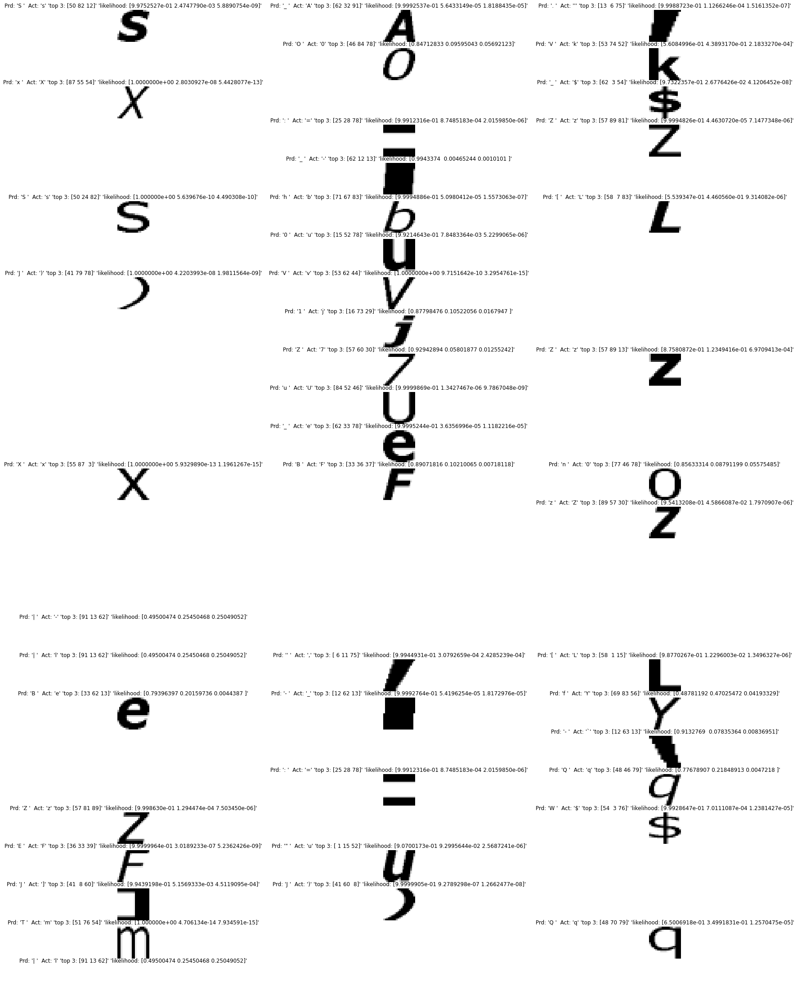

In [14]:

def print_images(net, testloader, il):
    plt.figure( figsize=(30, 70) )
    for index, data in enumerate (testloader):
                len_Y, labels = data
                outputs = net( len_Y )
                _, predicted = torch.max(outputs.data, 1)
                if predicted != labels:
                        plt.subplot( 45, 3, index+1 )
                        plt.axis('off')
                        top_3, soft = get_top_3 (predicted, labels, outputs)
                    
                        plt.title(f"Prd: '{chr(il[predicted.item()])} '  Act: '{chr(il[labels.item()])}' 'top 3: {top_3}' 'likelihood: {soft}'")
                        plt.imshow( np.reshape( len_Y[0, 0, :], (20,20) ), cmap='Greys', interpolation='nearest' )
                        top_3, soft = None, None


print_images(net_2, testloader, il)

```
self.fc1 = nn.Linear( self.pooledOutputSize, 2000 )
self.fc2 = nn.Linear( 2000, len_Y )
```
***
### Takeaway

* Test the accuracy of your network with character inputs from a DIFFERENT font set. How does it perform?

When I test on with a differnt set, my accuracy goes down

* Train your best network on inputs from the data from at least 2 different fonts. How does your accuracy compare to the 1-font case? What accuracy do you see when testing with inputs from a font you didn't train on?

Accuracy is not as good as the one font case. Especially when dealing with a test set on the font I didn't train on.

When I train my net on font one, and test it against font one, it is very accurate. In the high 90th percentile for accuracy. However, when I begin training on font one and two and test against font one, my accuracy dips down to the 60th percentile range.

* Take a look at some of the characters that have been misclassified. Do you notice any patterns? The network only produces the relative probabilities that the input is any of the possible characters. Can you find examples where the network is unsure of the result?

The network gets very confused when trying to determing the difference of a single quote '`'`' and a comma '`,`'. It also seems to be a six year old, because it confuses letters that are the inverse shape, such as '`z`' and '`s`'. The network also seems to be unsure of `[` or `]` or `I`

Looking at the output tensors of the predicted/true results, there is a high likelihood that a prediction will be wrong in the early epochs, but as the net trains, it becomes increasingly accurate

```
pred: 61
label: 11
[61  5 11]
```
the more the net trains, even if it gets the prediction wrong, the correct answer is in the top three

For the soft max, the earier predictions are very often unsure of the result. With about 33% for each of the top 3 being the likely result. Again though, as the net trains the net becomes more confident. Some issues where it is still unsure are as above, the  single quote '`'`' and a comma '`,`', or capital `O` compared to lower case `o` compared to zero `0`. However, fonts with the european zero, it was less unsure about the result because of the slash through the digit was enough to set it clearly apart.

in my exploration, I printed out both nets and it was interesting to see that for the first one it was a pretty even 1/3 1/3 1/3 split for what the net thought it was looking at.

# Part 4


In [15]:
def add_noise(X):
    noisy = []
    for x in X:
        row,col,ch = x.shape
        mean = 0
        var = 0.01
        sigma = var**0.5
        gauss = np.random.normal(mean,sigma,(row,col,ch))
        gauss = gauss.reshape(row,col,ch)
        noisy.append(x + gauss)
    return np.array(noisy)

In [16]:
df = pd.read_csv("./csvs/VERDANA.csv")



def get_data_2( df ):
    # du -sh * | sort -h
    # df = df[df["m_label"] < 128]
    # df = df[df["m_label"] > 33]
    print(f"length data frame: {len(df)}")
    x = df.columns
    pixel_values = [col for col in x if col[0] == 'r']
    print(f"length pixel values: {len(pixel_values)}")
    return (df, pixel_values)

df, pixel_values = get_data_2( df )

X,Y = get_X_and_Y(df, pixel_values)

Y , unique_Y, il, li = parse_Y( Y )

train_X, test_X, train_y, test_y  = train_test_split( X, Y, random_state=1, test_size=0.2 ) #create a list of training data

trainloader, testloader = make_loaders(train_X, test_X, train_y, test_y)

noisy_X = add_noise(X)

train_X, test_X, train_y, test_y  = train_test_split( noisy_X, Y, random_state=1, test_size=0.2 ) #create a list of training data

trainloader_noisy, testloader_noisy = make_loaders(train_X, test_X, train_y, test_y)


length data frame: 3562
length pixel values: 400
Before conversion to new index: num unique chars in y: 891, min/max y (ascii code): Y: min/max 33 65533
After conversion to new index: num unique chars in y: 891, min/max y (new index code): Y: min/max 0 890
Number of images used in trainloader: 2849 , grouped by 8 unique: 888
Number of images used in testloader: 713 , grouped by 1 unique: 529
Number of images used in trainloader: 2849 , grouped by 8 unique: 888
Number of images used in testloader: 713 , grouped by 1 unique: 529


In [17]:
class CnnNet(nn.Module):
    def __init__(self):
        super(CnnNet, self).__init__()
        
        self.encodedSize = 32
        
        self.c1Out = 8 # filters from first conv layer
        self.c2Out = 8 # filters from 2nd conv layer
        
        #the padding here puts a "border" of 0s around the image, so that convolution layers don't "shrink" the image
        
        self.cv1 = nn.Conv2d(1, self.c1Out, 3, padding=1) #stick with 3x3 filters
        #output is 8x 28x28 images
        self.pool = nn.MaxPool2d(2,2)
        self.cv2 = nn.Conv2d(self.c1Out, self.c2Out, 3, padding=1)
        #reuse pool here
        
        self.downscaledSize = 20//4 #we add padding, so the conv2d layers don't change the size, just the max pools
        self.flattenedSize = self.downscaledSize*self.downscaledSize*self.c2Out
        
        self.fc1 = nn.Linear(self.flattenedSize, 64)
        self.fc2 = nn.Linear(64, self.encodedSize) #scale down to 64 features

        #now we're encoded, so go define decoding pieces
        
        self.fc3 = nn.Linear(self.encodedSize, 64) #scale down to 64 features
        self.fc4 = nn.Linear(64, self.flattenedSize)
        
        
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')
        # the padding is very important here so we don't have to guess a "frame" of pixels around the image
        self.cv3 = nn.Conv2d(self.c2Out, self.c1Out, 3, padding=1)
        # apply upsample again
        self.cv4 = nn.Conv2d(self.c1Out, 1, 3, padding=1)
        
        
    def compress(self, x):
        x = self.cv1(x)
        #print("shape after cv1", x.shape)
        x = F.relu(self.pool(x))
        #print("shape after pool1", x.shape)
        x = self.cv2(x)
        #print("after cv2", x.shape)
        x = F.relu(self.pool(x))
        #print("after pool 2", x.shape)
        x = x.view(-1, self.flattenedSize)
        #print("flattened shape", x.shape)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        #now we have a low-d representation of our data.  If we were doing compression, we'd store this
        return x
    
    def decompress(self, x):
        x = F.relu(self.fc3(x))
        x = F.relu(self.fc4(x))
        #print(x.shape)
        x = x.view(-1, self.c2Out, self.downscaledSize, self.downscaledSize)
        #print("unflattened shape", x.shape)
        x = self.upsample(x)
        #print("upsample", x.shape)
        x = F.relu(self.cv3(x))
        #print(x.shape, "after cv3")
        x = self.cv4(self.upsample(x))
        #print(x.shape, "after both upsamples")
        return x
    
    def forward(self, x):
        x = self.compress(x)
        x = self.decompress(x)
       
        return x

CnnNet = CnnNet() # treat these as just 28 D vectors

In [18]:
#same as we did before except for the reshaping.  CNNs understand 2D images, so we don't want to flatten

# mean-squared error loss
# this is the normal "least squares" error function, divided by the number of data points
criterion = nn.MSELoss()

def train(model, epochs, trainloader):
    # create an optimizer object
    # Adam optimizer with learning rate 1e-3
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

        
    for epoch in range(epochs):
        loss = 0
        
        running_loss = 0
        
        for i, data in enumerate(trainloader, 0):

            # print("data", data)

            #same as yesterday, except we're not even looking at the labels!
            # since we're not using a CNN, we need to "flatten" the input images
            batch_features = data[0]

            # print("features", batch_features)
        
            # reset the gradients back to zero
            # PyTorch accumulates gradients on subsequent backward passes
            optimizer.zero_grad()
        
            # compute reconstructions
            outputs = model(batch_features)
            #print(batch_features.shape)
            #print(outputs.shape)
            # compute training reconstruction loss
            # again, same idea as yesterday, but we're measuring the error slightly differently
            # how well does the reconstructed image match the input image?
            train_loss = criterion(outputs, batch_features)
        
            # compute accumulated gradients
            train_loss.backward()
        
            # perform parameter update based on current gradients
            optimizer.step()
        
            # add the mini-batch training loss to epoch loss
            loss += train_loss.item()
    
            # print statistics
            running_loss += train_loss.item()
            if i % 2000 == 1999:    # print every 2000 mini-batches
                print('[%d, %5d] loss: %.8f' % (epoch + 1, i + 1, running_loss / 2000))
            running_loss = 0.0

    
        # compute the epoch training loss
        loss = loss / len(trainloader)
    
        # display the epoch training loss
        print("epoch : {}/{}, loss = {:.8f}".format(epoch + 1, epochs, loss))

def evaluate(model, test_loader):
    total_loss = 0
    with torch.no_grad():
        for data in test_loader:
            images = data[0]
            outputs = model(images)
            test_loss = criterion(outputs, images)
            total_loss += test_loss.item()

    print("overall loss: ", total_loss)

In [19]:
train(CnnNet, 4, trainloader_noisy)
evaluate(CnnNet, testloader)

epoch : 1/4, loss = 0.18760384
epoch : 2/4, loss = 0.13313911
epoch : 3/4, loss = 0.11092397
epoch : 4/4, loss = 0.09920807
overall loss:  61.279820462688804


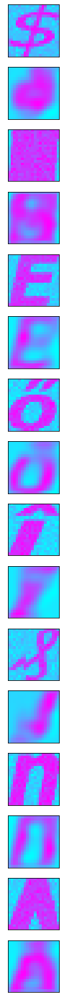

In [20]:
def drawComparisonsCNN(model, loader):
    # test_loader = torch.utils.data.DataLoader(loader, batch_size=8, shuffle=True, num_workers=0)
    plt.figure(figsize=(20, 25))
    for i, batch in enumerate(loader):
        if i >= 8: break
        images = batch[0]
        #print(images.shape)
        with torch.no_grad():
            reconstructed = model(images)
            for j in range(len(images)):
                #draw the original image
                ax = plt.subplot(16, 8, i*16 + j + 1)
                plt.imshow(images[j].reshape((20,20)), cmap="cool", interpolation=None)
                ax.get_xaxis().set_visible(False)
                ax.get_yaxis().set_visible(False)
            
                #and the reconstructed version in the next row
                ax = plt.subplot(16, 8, i*16 + j + 1 + 8)
                plt.imshow(reconstructed[j].reshape((20,20)), cmap="cool", interpolation=None)
                ax.get_xaxis().set_visible(False)
                ax.get_yaxis().set_visible(False)
        
drawComparisonsCNN(CnnNet, testloader_noisy)